In [1]:
import pandas as pd
from scipy.stats import t, norm, sem
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns # for making nicer plots and histograms
sns.set()  # for styling of plots

In [2]:
df = pd.read_csv('Electrical_Permits_Solar.csv')

In [3]:
df.head()

,Permit Number,Application Creation Date,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,Unit,Unit Suffix,...,Location,SF Find Neighborhoods 2,Current Police Districts 2,Current Supervisor Districts 2,Analysis Neighborhoods 2,Current Police Districts (2) 2,Zip Codes 2,Fire Prevention Districts 2,Supervisor Districts (1) 2,Neighborhoods
0,EW201910013870,10/01/2019 12:00:00 AM,4260,012,2318,NaN,25th,St,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,E200306309734,06/30/2003 12:00:00 AM,1469,002,465,NaN,36th,Av,NaN,NaN,...,POINT (-122.4968907383367 37.78007955058543),8.0,8.0,4.0,29.0,9.0,55.0,11.0,2.0,8.0
2,E200305017316,05/01/2003 12:00:00 AM,2983,034,625,NaN,Ulloa,St,NaN,NaN,...,POINT (-122.46156071040872 37.74063231782043),49.0,10.0,8.0,41.0,5.0,59.0,1.0,4.0,49.0
3,E200309082505,09/08/2003 12:00:00 AM,3735,012,95,NaN,Hawthorne,St,NaN,NaN,...,POINT (-122.39789821083205 37.78505019413315),32.0,1.0,10.0,8.0,2.0,28855.0,6.0,9.0,32.0
4,E20021120997,11/20/2002 12:00:00 AM,6532,045,8,NaN,Juri,St,NaN,NaN,...,POINT (-122.42197655296884 37.75004671278727),53.0,3.0,5.0,20.0,7.0,28859.0,2.0,5.0,53.0


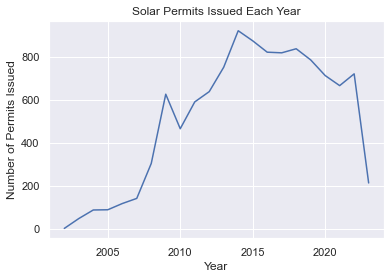

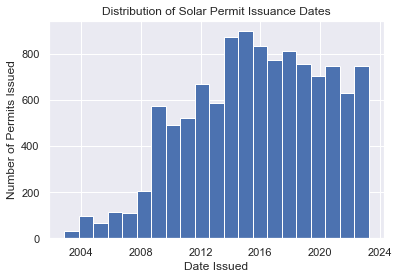

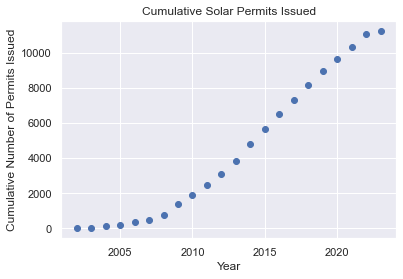

In [4]:
##Create some basic visual represenations

# Convert the date column to a pandas datetime format
df['Completed Date'] = pd.to_datetime(df['Completed Date'])

# Create a new column to represent the year of the permit
df['month_issued'] = df['Completed Date'].dt.month
df['year_issued'] = df['Completed Date'].dt.year

# Group the DataFrame by year of permit and count the number of permits issued in each year
permits_per_year = df.groupby('year_issued').size()

# Create a line plot of the number of permits issued each year
plt.plot(permits_per_year.index, permits_per_year.values)
plt.title('Solar Permits Issued Each Year')
plt.xlabel('Year')
plt.ylabel('Number of Permits Issued')
plt.show()

# Create a histogram of the distribution of permit issuance dates
plt.hist(df['Completed Date'], bins=21)
plt.title('Distribution of Solar Permit Issuance Dates')
plt.xlabel('Date Issued')
plt.ylabel('Number of Permits Issued')
plt.show()

# Create a scatter plot of the year of permit issuance versus the total number of permits issued up to that year
cumulative_permits = permits_per_year.cumsum()
plt.scatter(permits_per_year.index, cumulative_permits)
plt.title('Cumulative Solar Permits Issued')
plt.xlabel('Year')
plt.ylabel('Cumulative Number of Permits Issued')
plt.show()

In [5]:
# Extract the latitude and longitude from the Location column using a regular expression
df['latitude'] = df['Location'].str.extract(r'(-?\d+\.\d+)\)')

df['longitude'] = df['Location'].str.extract(r'POINT \((-?\d+\.\d+)')

# Convert the latitude and longitude columns to a float data type
df['latitude'] = df['latitude'].astype(float)
df['longitude'] = df['longitude'].astype(float)

# Display the DataFrame with the new columns
print(df.head())

    Permit Number Application Creation Date Block  Lot  Street Number  \
0  EW201910013870    10/01/2019 12:00:00 AM  4260  012           2318   
1   E200306309734    06/30/2003 12:00:00 AM  1469  002            465   
2   E200305017316    05/01/2003 12:00:00 AM  2983  034            625   
3   E200309082505    09/08/2003 12:00:00 AM  3735  012             95   
4    E20021120997    11/20/2002 12:00:00 AM  6532  045              8   

  Street Number Suffix Street Name Street Suffix  Unit Unit Suffix  ...  \
0                  NaN        25th            St   NaN         NaN  ...   
1                  NaN        36th            Av   NaN         NaN  ...   
2                  NaN       Ulloa            St   NaN         NaN  ...   
3                  NaN   Hawthorne            St   NaN         NaN  ...   
4                  NaN        Juri            St   NaN         NaN  ...   

  Analysis Neighborhoods 2 Current Police Districts (2) 2 Zip Codes 2  \
0                      NaN           

In [6]:
import os

from PIL import Image
from pyproj import Proj, transform
import numpy as np

import matplotlib.pyplot as plt
import numpy as np
import rioxarray as rxr
import geopandas as gpd
import earthpy as et
import earthpy.plot as ep
import earthpy.spatial as es

In [7]:
from shapely.geometry import Polygon, mapping


dfPolygonVertices = pd.read_csv('polygonVertices_LatitudeLongitude.csv')
SolarStockList = pd.read_csv('SolarStocktonList3.csv')


dfPolygonArray = dfPolygonVertices.to_numpy()


dfPolygonArray[0]

tightCoordArray = []

for item in dfPolygonArray:
    numberCoordinates = item[1]
    polygonCoordinates = []
    for coordinate in range(int(numberCoordinates)):
        coordinate = coordinate + 1
        polygonCoordinates.append((item[2*coordinate], item[2*coordinate+1]))
    tightCoordArray.append(polygonCoordinates)
    print(polygonCoordinates)



[(-119.8403029, 36.92625127), (-119.8406817, 36.92636019), (-119.8408023, 36.92639552), (-119.8408126, 36.92637337), (-119.840806, 36.92637141), (-119.8408066, 36.92636992), (-119.8403184, 36.92622673), (-119.8403029, 36.92625127)]
[(-119.8403068, 36.92641883), (-119.8407954, 36.92656061), (-119.840796, 36.92655992), (-119.8408014, 36.92656154), (-119.8408157, 36.92653849), (-119.840814, 36.92653796), (-119.8408163, 36.92653516), (-119.8403214, 36.92639103), (-119.8403068, 36.92641883)]
[(-119.8403195, 36.9264766), (-119.8403194, 36.92647656), (-119.8403109, 36.92649237), (-119.8403066, 36.92650034), (-119.8403067, 36.92650036), (-119.8403062, 36.92650121), (-119.8405935, 36.92658227), (-119.840644, 36.92659671), (-119.8407411, 36.92659313), (-119.8403198, 36.92647612), (-119.8403195, 36.9264766)]
[(-119.8427634, 36.92095723), (-119.8427654, 36.92095896), (-119.8427643, 36.92095964), (-119.8429041, 36.92107958), (-119.8429328, 36.92106186), (-119.8427949, 36.92094026), (-119.8427912, 3

In [8]:
##Load the NAIP file 

os.chdir(os.path.join(et.io.HOME, 'earth-analytics', 'data'))

stockton_1_path = os.path.join("stockton-data", 
                             "m_3712106_ne_10_060_20220621", 
                             "m_3712106_ne_10_060_20220621.tif")

stockton_2_path = os.path.join("stockton-data", 
                             "m_3712106_nw_10_060_20220621", 
                             "m_3712106_nw_10_060_20220621.tif")

stockton_3_path = os.path.join("stockton-data", 
                             "m_3712107_nw_10_060_20220621", 
                             "m_3712107_nw_10_060_20220621.tif")

stockton_4_path = os.path.join("stockton-data", 
                             "m_3812162_se_10_060_20220621", 
                             "m_3812162_se_10_060_20220621.tif")

stockton_5_path = os.path.join("stockton-data", 
                             "m_3812162_sw_10_060_20220621", 
                             "m_3812162_sw_10_060_20220621.tif")

stockton_6_path = os.path.join("stockton-data", 
                             "m_3712106_se_10_060_20220621", 
                             "m_3712106_se_10_060_20220621.tif")

import rasterio
from rasterio.warp import transform_bounds

def crop_image(min_lon, min_lat, max_lon, max_lat, naip_csf_path, new_file):

# define the bounding box of the desired rectangular image using lat/long coordinates
#min_lon, min_lat, max_lon, max_lat = -122.420, 37.764, -122.419, 37.765
# min_lon, min_lat, max_lon, max_lat = -122.4198, 37.764, -122.4191, 37.765

    # open the NAIP tif file
    with rasterio.open(naip_csf_path) as src:
        # get the spatial reference system of the tif file
        crs = src.crs

        # transform the bounding box coordinates from lat/long to the tif file's coordinate system
        min_x, min_y, max_x, max_y = transform_bounds('EPSG:4326', crs, min_lon, min_lat, max_lon, max_lat)

        # read the data of the tif file within the bounding box
        window = rasterio.windows.from_bounds(min_x, min_y, max_x, max_y, src.transform)
        data = src.read(window=window)

        # create a new raster with the same metadata as the original tif file, but with the cropped data
        profile = src.profile.copy()
        profile.update(width=window.width, height=window.height, transform=src.window_transform(window))
        with rasterio.open(new_file, 'w', **profile) as dst:
            dst.write(data)

In [51]:
import geopandas as gpd
import rasterio
from shapely.geometry import Polygon

# Input TIFF file path
input_tif_path = stockton_6_path

stockton1_coordinates = []


# Read the input TIFF file
with rasterio.open(input_tif_path) as src:
    # Get the bounds of the TIFF file
    tiff_bounds = src.bounds
    print(src.bounds)
    
    for coordiantes in tightCoordArray:
        polygon = Polygon(coordiantes)
        print(polygon.boundary)

        # Create a GeoDataFrame with the polygon
        gdf = gpd.GeoDataFrame(geometry=[polygon], crs='EPSG:4269')
        print(gdf)

        gdf = gdf.to_crs(src.crs)

            # Get the bounds of the polygon
        polygon_bounds = gdf.geometry.bounds

        # Check if the polygon bounds are within the TIFF file bounds
        is_contained = (tiff_bounds[0] <= polygon_bounds.minx.min() and
                        tiff_bounds[1] <= polygon_bounds.miny.min() and
                        tiff_bounds[2] >= polygon_bounds.maxx.max() and
                        tiff_bounds[3] >= polygon_bounds.maxy.max())


        if is_contained:
            stockton1_coordinates.append(polygon)
    
print(len(stockton1_coordinates))


BoundingBox(left=648090.0, bottom=4193088.0, right=654114.0, top=4200528.0)
LINESTRING (-119.8403029 36.92625127, -119.8406817 36.92636019, -119.8408023 36.92639552, -119.8408126 36.92637337, -119.840806 36.92637141, -119.8408066 36.92636992, -119.8403184 36.92622673, -119.8403029 36.92625127)
                                            geometry
0  POLYGON ((-119.84030 36.92625, -119.84068 36.9...
LINESTRING (-119.8403068 36.92641883, -119.8407954 36.92656061, -119.840796 36.92655992, -119.8408014 36.92656154, -119.8408157 36.92653849, -119.840814 36.92653796, -119.8408163 36.92653516, -119.8403214 36.92639103, -119.8403068 36.92641883)
                                            geometry
0  POLYGON ((-119.84031 36.92642, -119.84080 36.9...
LINESTRING (-119.8403195 36.9264766, -119.8403194 36.92647656, -119.8403109 36.92649237, -119.8403066 36.92650034, -119.8403067 36.92650036, -119.8403062 36.92650121, -119.8405935 36.92658227, -119.840644 36.92659671, -119.8407411 36.92659313, -119.

In [52]:
##Create an array of the centroids of the polygons to help match 
polygonCentroids = []

for polyon in stockton1_coordinates:
    polygonCentroids.append(polyon.exterior.centroid)



In [53]:
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
from sklearn.neighbors import BallTree
from datetime import datetime

csv_file = 'SolarStocktonList3.csv'
df = pd.read_csv(csv_file)

# polygonCentroids = []

# for polygon in stockton1_coordinates:


## Create the two GeoDataFrame to replicate your dataset
polygons = gpd.GeoDataFrame([{
        'geometry': point,
        'x': point.x,
        'y': point.y,
    } for point in polygonCentroids
])

solar_installations = gpd.GeoDataFrame([{
        'geometry': Point(a, b),
        'x': a,
        'y': b,
    } for a, b in zip(df['Longitude'], df['Latitude'])
])

# Create a BallTree 
tree = BallTree(solar_installations[['x', 'y']].values, leaf_size=2)

# Query the BallTree on each feature from 'appart' to find the distance
# to the nearest 'pharma' and its id
polygons['distance_nearest'], polygons['id_nearest'] = tree.query(
    polygons[['x', 'y']].values, # The input array for the query
    k=1, # The number of nearest neighbors
)
print(polygons)

addressesOfPolygons = []
ageOfInstallationOfPolygons = []
sizeOfInstallations = []

def calculate_years_before(date_string):
    date = datetime.strptime(date_string, "%m/%d/%y")
    reference_date = datetime(2022, 6, 1)  # June 1, 2022

    years_difference = reference_date.year - date.year
    if reference_date.month < date.month or (reference_date.month == date.month and reference_date.day < date.day):
        years_difference -= 1

    return years_difference // 2


for indexOfPolygon in range(len(polygons)):
    nearestId = polygons.loc[indexOfPolygon, 'id_nearest']
    address = df.loc[nearestId,'Address']
    install_date = df.loc[nearestId, 'Date']
    size = df.loc[nearestId, 'Size (kW)']
    addressesOfPolygons.append(address)
    ageOfInstallationOfPolygons.append(calculate_years_before(install_date))
    sizeOfInstallations.append(size)
    print(address)

large_distance = 0

for indexOfPolygon in range(len(polygons)):
    distance = polygons.loc[indexOfPolygon, 'distance_nearest']
    if distance > 0.05:
        large_distance = large_distance + 1
        print(distance)

print(large_distance)
print(ageOfInstallationOfPolygons)

                        geometry           x          y  distance_nearest  \
0    POINT (-121.25042 37.91234) -121.250425  37.912340          0.007341   
1    POINT (-121.25736 37.92018) -121.257358  37.920185          0.000548   
2    POINT (-121.25723 37.92022) -121.257233  37.920217          0.000528   
3    POINT (-121.24948 37.92504) -121.249485  37.925037          0.003605   
4    POINT (-121.24950 37.92501) -121.249496  37.925007          0.003573   
..                           ...         ...        ...               ...   
146  POINT (-121.31060 37.89842) -121.310599  37.898424          0.000519   
147  POINT (-121.30307 37.89761) -121.303067  37.897612          0.000615   
148  POINT (-121.30180 37.89746) -121.301795  37.897462          0.000164   
149  POINT (-121.31133 37.90313) -121.311328  37.903130          0.000077   
150  POINT (-121.31445 37.90248) -121.314450  37.902482          0.000388   

     id_nearest  
0          8848  
1          4048  
2          4048  
3  

In [54]:
###WORKS SUPER WELL

import geopandas as gpd
import rasterio
from rasterio.plot import show
from shapely.geometry import Polygon


# Input TIFF file path
input_tif_path = stockton_6_path

# Output TIFF file path
output_tif_path = 'output.tif'

def add_offset_to_polygon(polygon, offset):
    new_coordinates = []
    for x, y in polygon.exterior.coords:
        new_coordinates.append((x + offset, y))
    return Polygon(new_coordinates)

def calculate_years_before(date_string):
    date = datetime.strptime(date_string, "%m/%d/%y")
    reference_date = datetime(2022, 6, 1)  # June 1, 2022

    years_difference = reference_date.year - date.year
    if reference_date.month < date.month or (reference_date.month == date.month and reference_date.day < date.day):
        years_difference -= 1

    return years_difference // 2


lengthOfArray = len(stockton1_coordinates)
print(lengthOfArray)

namesOfTifFiles = []
namesOfPNGFiles = []


for x in range(lengthOfArray):
    # Polygon of latitude and longitude coordinates
    coordiantes = stockton1_coordinates[x]
    # for individCoords in coordiantes:

    coordiantes  = add_offset_to_polygon(coordiantes, -0.00002)

    #coordiantes = Polygon([(-119.8403229, 36.92625127), (-119.8407017, 36.92636019), (-119.8408223, 36.92639552), (-119.8408326, 36.92637337), (-119.840826, 36.92637141), (-119.8408266, 36.92636992), (-119.8403384, 36.92622673), (-119.8403229, 36.92625127)])

    # Convert the polygon coordinates to a Shapely Polygon object
    polygon = Polygon(coordiantes)
    print(polygon.is_valid)


    # Create a GeoDataFrame with the polygon
    gdf = gpd.GeoDataFrame(geometry=[polygon], crs='EPSG:4269')
    print(gdf.geometry)

    # Read the input TIFF file
    with rasterio.open(input_tif_path) as src:
        # Reproject the GeoDataFrame to match the TIFF file's projection
        # Create a GeoDataFrame with the polygon
        # gdf = gpd.GeoDataFrame(geometry=[polygon], crs=src.crs)
        gdf = gdf.to_crs(src.crs)

        print(gdf.geometry)

        # Create an empty mask image with the same shape as the TIFF file
        mask = rasterio.features.geometry_mask(gdf.geometry, out_shape=src.shape, transform=src.transform, invert=False)

        # Read the input TIFF data
        data = src.read()

        # Set the pixels outside the mask to white color (255, 0, 0)
        array_mask = np.array([[255],
                            [255],
                            [255],
                            [255]])
        data[:, mask] = array_mask

        # Write the modified data to the output TIFF file
        with rasterio.open(output_tif_path, 'w', **src.meta) as dst:
            dst.write(data)

        
    # Create an array containing the geographic coordinates for the row
    coordinates = np.array([
        polygon.bounds[0] - 0.000015,
        polygon.bounds[1] - 0.000015,
        polygon.bounds[2] + 0.000015,
        polygon.bounds[3] + 0.000015
    ])

    # # Parse the original date string
    # date = datetime.strptime(dateOfInstallationOfPolygons[x], "%m/%d/%y")

    # # Format the date as "21December2020"
    # formatted_date = date.strftime("%d%B%Y")

    # Create the TIFF file name using the Permit Number column
    tiff_name = str(x+1985) + '_' + str(ageOfInstallationOfPolygons[x]) + '_' + addressesOfPolygons[x] + '_' + str(sizeOfInstallations[x]) + '.tif'
    namesOfTifFiles.append(tiff_name)


    ##Crop images
    crop_image(coordinates[0], coordinates[1], coordinates[2], coordinates[3], output_tif_path, tiff_name)

    ##Export IR band in red band

    # Open the GeoTIFF file
    tiff_path = tiff_name
    tiff_data = rasterio.open(tiff_path)

    # Read the first three bands
    band_indices = [4,2,3]  # Indices of the desired bands
    selected_bands = tiff_data.read(band_indices)

    # # Rescale the pixel values to 0-255 range
    # min_value = selected_bands.min()
    # max_value = selected_bands.max()
    # scaled_bands = 255 * (selected_bands - min_value) / (max_value - min_value)

    # Convert the bands to 8-bit unsigned integer
    scaled_bands = selected_bands.astype('uint8')

    # Merge the bands into an RGB image
    rgb_image = np.dstack((scaled_bands[0], scaled_bands[1], scaled_bands[2]))

    # Create a PIL Image from the numpy array
    image = Image.fromarray(rgb_image)

    # Define the output PNG file path
    png_path = str(x) + '_' + str(ageOfInstallationOfPolygons[x]) + '_' + addressesOfPolygons[x] + '_' + str(sizeOfInstallations[x]) + '.png'

    namesOfPNGFiles.append(png_path)

    # Save the image as PNG
    image.save(png_path)

    # Close the GeoTIFF file
    tiff_data.close()





151
True
0    POLYGON ((-121.25045 37.91230, -121.25045 37.9...
Name: geometry, dtype: geometry
0    POLYGON ((653794.845 4197527.612, 653794.847 4...
Name: geometry, dtype: geometry
True
0    POLYGON ((-121.25740 37.92019, -121.25739 37.9...
Name: geometry, dtype: geometry
0    POLYGON ((653167.291 4198391.952, 653167.912 4...
Name: geometry, dtype: geometry
True
0    POLYGON ((-121.25729 37.92022, -121.25728 37.9...
Name: geometry, dtype: geometry
0    POLYGON ((653176.965 4198395.644, 653177.492 4...
Name: geometry, dtype: geometry
True
0    POLYGON ((-121.24953 37.92503, -121.24948 37.9...
Name: geometry, dtype: geometry
0    POLYGON ((653848.941 4198941.178, 653852.801 4...
Name: geometry, dtype: geometry
True
0    POLYGON ((-121.24950 37.92500, -121.24949 37.9...
Name: geometry, dtype: geometry
0    POLYGON ((653851.613 4198938.433, 653852.626 4...
Name: geometry, dtype: geometry
True
0    POLYGON ((-121.25238 37.92144, -121.25238 37.9...
Name: geometry, dtype: geometry
0    POLY

In [55]:
import pandas as pd

# Create a complex DataFrame
data = {'FileNamePNG': namesOfPNGFiles,
        'FileNameTIF': namesOfTifFiles,
        'SolarPanelAge': ageOfInstallationOfPolygons,
        'Address': addressesOfPolygons,
        'Polygon': stockton1_coordinates,
        'Size': sizeOfInstallations
        }
df = pd.DataFrame(data)

# Export DataFrame to CSV
df.to_csv('stockton6_tif_files.csv', index=False)

# Create a simple DataFrame
data = {'FileNamePNG': namesOfPNGFiles,
        'SolarPanelAge': ageOfInstallationOfPolygons,
        }
df = pd.DataFrame(data)

# Export DataFrame to CSV
df.to_csv('stockton6_tif_files_simple.csv', index=False)